# Feature Engineering
    
    Numerical Transformations
    Categorical 
    Time
    Text
    
       
    
    
# Linear Regression


# Decision Tree
    
    %%html
<!-- <style>
div.input {
    display:none;
}
</style> -->
    
    
    





In [1]:
# !pip install scikit-learn==1.0.2 --upgrade
# !pip install raiwidgets
# !pip install --upgrade shap


In [2]:
import pkg_resources
# pkg_resources.require("scikit-learn==1.0.2")
import sklearn
import shap
import pandas as pd
import numpy as np
import seaborn as sns
import seaborn as sns
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = (40,10)


C:\Users\ankommar\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\_distributor_init.py:32: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\ankommar\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\.libs\libopenblas.4SP5SUA7CBGXUEOC35YP2ASOICYYEQZZ.gfortran-win_amd64.dll
C:\Users\ankommar\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\.libs\libopenblas.XWYDX2IKJW2NMTWSFYNGFUWKQU3LYTCZ.gfortran-win_amd64.dll
  stacklevel=1)


In [3]:
sklearn.__version__

'1.0.2'

In [7]:
#Fetch data 
df=pd.read_csv("data/house-prices-advanced-regression-techniques/train.csv") #Regression
nyc=pd.read_csv("data/bus-breakdown-and-delays.csv") #Regression
stores=pd.read_csv("data/store-sales-time-series-forecasting/train.csv") #Time Series Forecasting
# credit=pd.read_csv("data/creditcard.csv")
fitbit=pd.read_csv("data/minuteStepsNarrow_merged.csv")
# ninelevel=pd.read_csv("data/911.csv")
incident=pd.read_csv("data/incident_event_log.csv")
boats=pd.read_csv("data/BoatProduct.csv")
iris_df = sns.load_dataset("iris")
iris_df = iris_df[iris_df["species"] == "setosa"]

df_reg=pd.read_csv("data/training_df.csv")

In [8]:
df=pd.read_csv("data/house-prices-advanced-regression-techniques/train.csv") #Regression
nan_list=df.columns[df.isna().all()].tolist()
df_numeric=df.select_dtypes(include=np.number).drop("Id",axis=1)

df_categorical=df.select_dtypes(include=np.object)
df_numeric.columns

`np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

In [9]:
df_reg['Unnamed: 0']

0          0
1          2
2          3
3          4
4          5
        ... 
1396    1454
1397    1455
1398    1456
1399    1457
1400    1458
Name: Unnamed: 0, Length: 1401, dtype: int64

### Numeric Transoformation - Log Transform

In [10]:
sns.scatterplot(data=df_numeric,x='LotArea',y='SalePrice')

<AxesSubplot:xlabel='LotArea', ylabel='SalePrice'>

In [11]:

df_transform=df_numeric
df_transform['lnLotArea']=np.log(df_transform['LotArea'])
df_transform['lnSalePrice']=np.log(df_transform['SalePrice'])
sns.scatterplot(data=df_transform,x='lnLotArea',y='lnSalePrice')

<AxesSubplot:xlabel='LotArea', ylabel='SalePrice'>

:  The r2 is:  -0.014119869360990078
:  The rmse is:  6386043410.14162


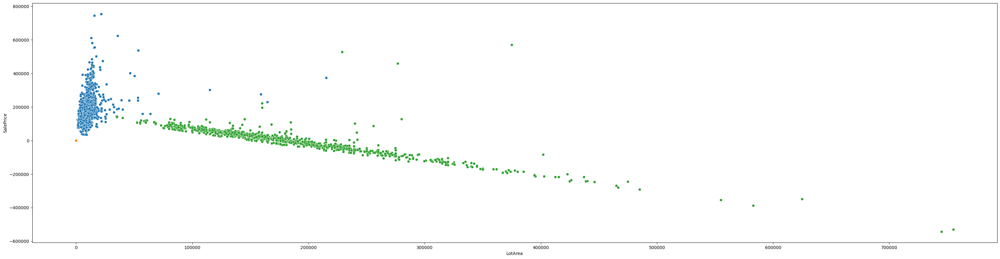

In [12]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
from sklearn.model_selection import train_test_split

X=df_transform['LotArea']
y=df_transform['SalePrice']
X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=True, train_size=0.3)
model.fit(X_train.to_numpy().reshape(-1, 1), y_train)
from sklearn.metrics import mean_squared_error, r2_score
predictions = model.predict(X_test.to_numpy().reshape(-1,1))
r2 = r2_score(y_test, predictions)
rmse = mean_squared_error(y_test, predictions)

print(':  The r2 is: ', r2)
print(':  The rmse is: ', rmse)

sns.scatterplot(x=y_test,y=predictions-y_test)
plt.show()

:  The r2 is:  -0.12299635992117164
:  The rmse is:  0.17006961780903035


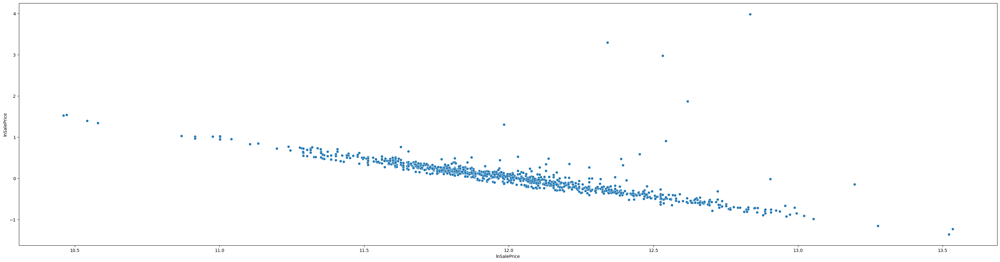

In [13]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
from sklearn.model_selection import train_test_split

X=df_transform['LotArea']
y=df_transform['lnSalePrice']
X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=True, train_size=0.3)
model.fit(X_train.to_numpy().reshape(-1, 1), y_train)
from sklearn.metrics import mean_squared_error, r2_score
predictions = model.predict(X_test.to_numpy().reshape(-1,1))
r2 = r2_score(y_test, predictions)
rmse = mean_squared_error(y_test, predictions)

print(':  The r2 is: ', r2)
print(':  The rmse is: ', rmse)

sns.scatterplot(x=y_test,y=predictions-y_test)
plt.show()

### Scaling and Normalization

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


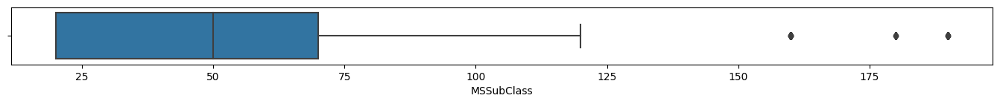

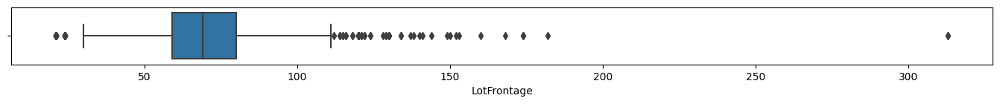

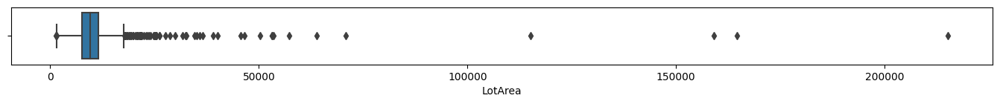

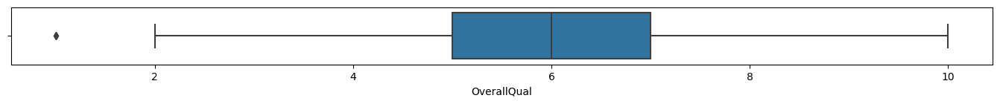

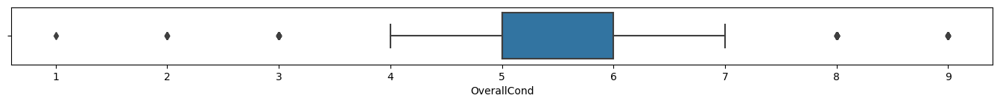

...

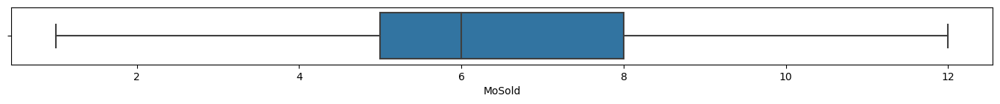

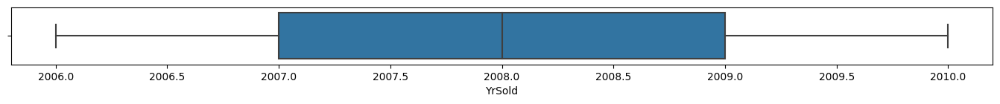

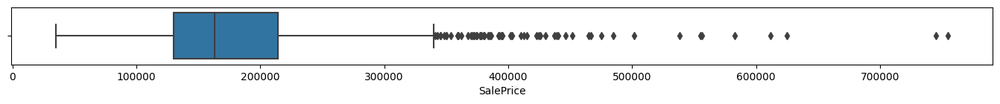

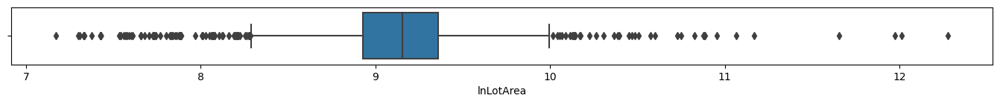

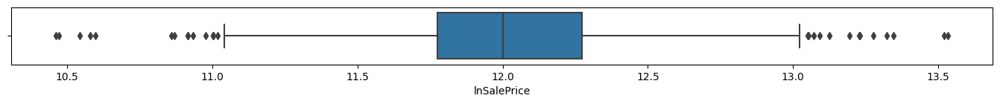

In [14]:
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler, MinMaxScaler
scaler=StandardScaler()
minmax=MinMaxScaler()
df_numeric2=df_numeric.drop("SalePrice",axis=1)
df_numeric_scaler=scaler.fit_transform(df_numeric2)
df_numeric_scaler = pd.DataFrame(df_numeric_scaler, index=df_numeric2.index, columns=df_numeric2.columns)
df_numeric_scaler['SalePrice']=df_numeric['SalePrice']
df_numeric_norm=minmax.fit_transform(df_numeric2)
df_numeric_norm = pd.DataFrame(df_numeric_norm, index=df_numeric2.index, columns=df_numeric2.columns)
df_numeric_norm['SalePrice']=df_numeric['SalePrice']
for column in df_numeric:
        plt.figure(figsize=(17,1))
        sns.boxplot(data=df_numeric, x=column)
        
#Lot Area
#Base Area
#Garage Area
#Garage Cars

plt.show()

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


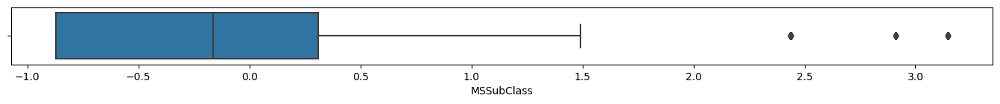

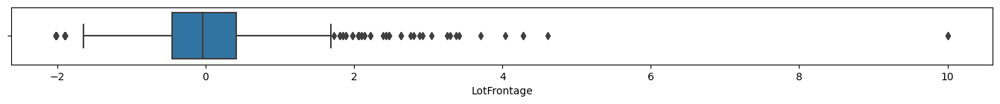

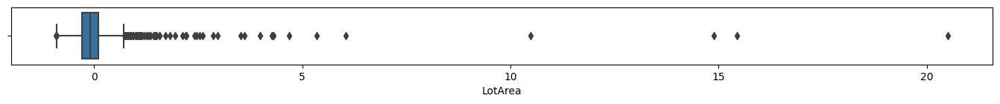

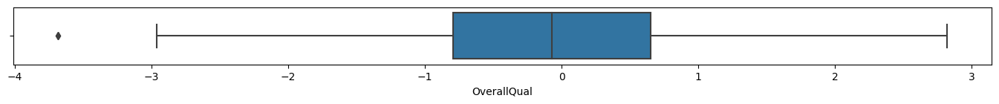

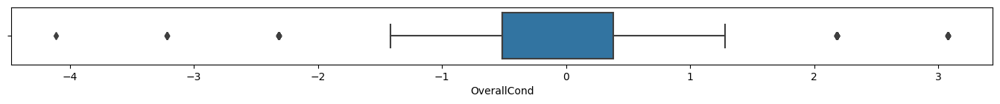

...

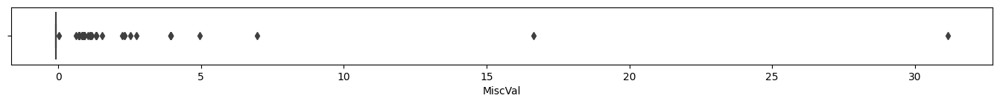

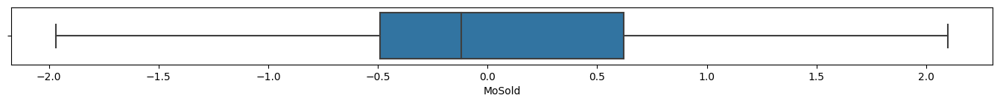

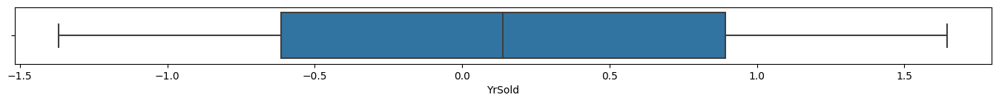

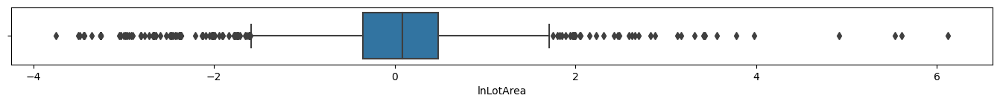

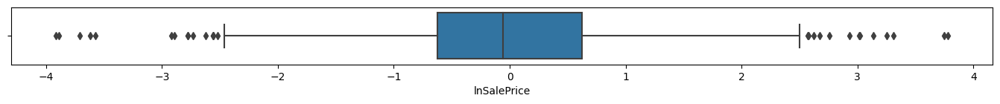

In [15]:
for column in df_numeric2:
        plt.figure(figsize=(17,1))
        sns.boxplot(data=df_numeric_scaler, x=column)
plt.show()

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


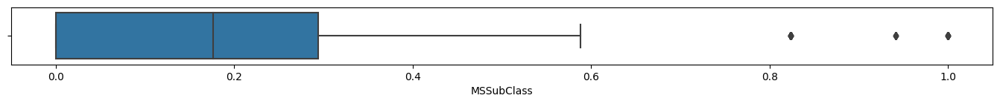

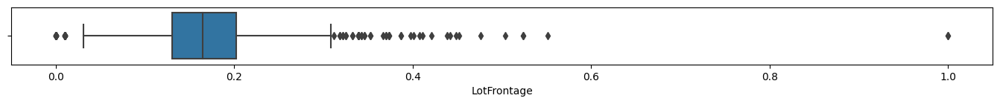

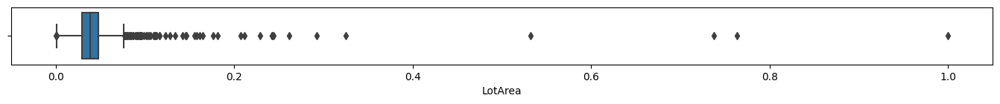

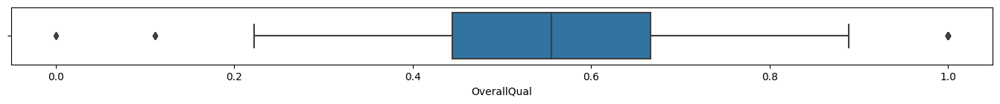

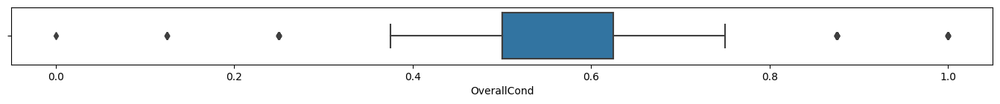

...

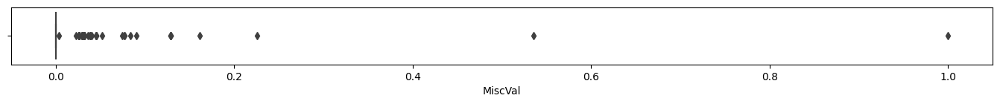

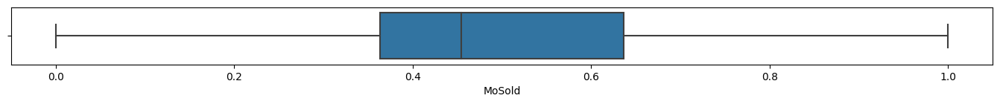

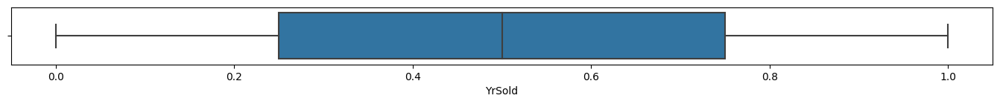

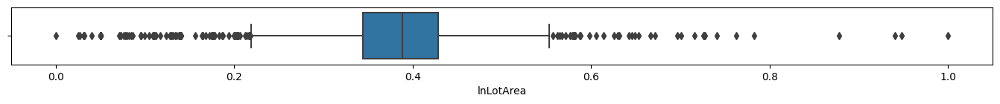

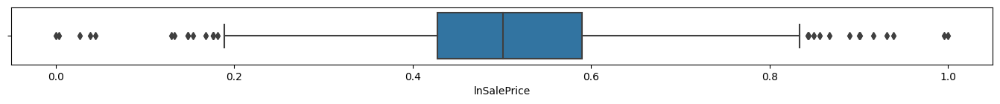

In [16]:
for column in df_numeric2:
        plt.figure(figsize=(17,1))
        sns.boxplot(data=df_numeric_norm, x=column)
plt.show()

In [17]:
# import matplotlib.pyplot as plt

# for column in df_numeric:
#         plt.figure(figsize=(17,1))
#         sns.histplot(data=df_numeric, x=column)

### Categorical Variables

In [18]:
col_list=df_categorical.isna().sum().to_dict()
final=[]
for k,v in col_list.items():
    if(v==0):
        final.append(k)
df_categorical2=df_categorical[final]
df_categorical2

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,ExterCond,Foundation,Heating,HeatingQC,CentralAir,KitchenQual,Functional,PavedDrive,SaleType,SaleCondition
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,TA,PConc,GasA,Ex,Y,Gd,Typ,Y,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,...,TA,CBlock,GasA,Ex,Y,TA,Typ,Y,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,TA,PConc,GasA,Ex,Y,Gd,Typ,Y,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,...,TA,BrkTil,GasA,Gd,Y,Gd,Typ,Y,WD,Abnorml
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,...,TA,PConc,GasA,Ex,Y,Gd,Typ,Y,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,...,TA,PConc,GasA,Ex,Y,TA,Typ,Y,WD,Normal
1456,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,...,TA,CBlock,GasA,TA,Y,TA,Min1,Y,WD,Normal
1457,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,...,Gd,Stone,GasA,Ex,Y,Gd,Typ,Y,WD,Normal
1458,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,...,TA,CBlock,GasA,Gd,Y,Gd,Typ,Y,WD,Normal


In [19]:
# # dict( zip( df_categorical['MSZoning'].cat.codes, df_categorical['MSZoning'] ) )
# cat_dict={}
# for c in list(df_categorical2.columns):
#     df_categorical2[c] = df_categorical2[c].astype('category')
#     temp_c=dict(zip(df_categorical2[c].cat.codes, df_categorical2[c]))
#     cat_dict[c]=list(temp_c.values())

#### One Hot Encoder

In [20]:
import pandas as pd
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder

class CategoricalOneHot(BaseEstimator, TransformerMixin):
    def __init__(self, list_key_words=None):
        self.oh_dict = {}
        self.list_key_words = list_key_words

    def fit(self, X, y=None):
        self.list_cat_col = []
        for key_word in self.list_key_words:
            self.list_cat_col = self.list_key_words
#             += [col for col in X.columns if key_word in col]
        for col in self.list_cat_col:
            oh = OneHotEncoder(handle_unknown="ignore", sparse=False)
            oh.fit(X[[col]])
            names = oh.get_feature_names()
            names2 = []
            for nam in names:
                names2.append(col+"_"+nam)
            self.oh_dict[col] = (oh, names2)
        return self

    def transform(self, X):
        _X = X.copy()
        for col in self.list_cat_col:
            oh = self.oh_dict[col][0]
            df_oh = pd.DataFrame(
                data=oh.transform(_X[[col]]),
                columns=self.oh_dict[col][1],
                index=_X.index)
            _X = pd.concat([_X, df_oh], axis=1)
            _X.drop(col, axis=1, inplace=True)
        return _X

    
class CategoricalOrdinal(BaseEstimator, TransformerMixin):
    def __init__(self, list_key_words=None):
        self.oh_dict = {}
        self.list_key_words = list_key_words

    def fit(self, X, y=None):
        self.list_cat_col = []
        for key_word in self.list_key_words:
            self.list_cat_col = self.list_key_words
#             += [col for col in X.columns if key_word in col]
        for col in self.list_cat_col:
            oh = OrdinalEncoder()
            oh.fit(X[[col]])
            self.oh_dict[col] = (oh, col)            
        return self

    def transform(self, X):
        _X = X.copy()
        for col in self.list_cat_col:
            
            oh = self.oh_dict[col][0]
            df_oh = pd.DataFrame(
                data=oh.transform(_X[[col]]),
                columns=[col+"_ordinal"],
                index=_X.index)
            _X = pd.concat([_X, df_oh], axis=1)
            _X.drop(col, axis=1, inplace=True)
            
        return _X
    

if __name__ == "__main__":
    #['BldgType']
    coh = CategoricalOneHot(list_key_words=list(df_categorical2.columns))
    df_categorical_ohe=(coh.fit_transform(df_categorical2))
    
#     coh = CategoricalOrdinal(list_key_words=list(df_categorical2.columns))
#     df_categorical_ohe=(coh.fit_transform(df_categorical2))

df_categorical_ohe

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be r

,MSZoning_x0_C (all),MSZoning_x0_FV,MSZoning_x0_RH,MSZoning_x0_RL,MSZoning_x0_RM,Street_x0_Grvl,Street_x0_Pave,LotShape_x0_IR1,LotShape_x0_IR2,LotShape_x0_IR3,...,SaleType_x0_ConLw,SaleType_x0_New,SaleType_x0_Oth,SaleType_x0_WD,SaleCondition_x0_Abnorml,SaleCondition_x0_AdjLand,SaleCondition_x0_Alloca,SaleCondition_x0_Family,SaleCondition_x0_Normal,SaleCondition_x0_Partial
0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1456,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1457,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1458,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [21]:
# import pandas as pd
# import numpy as np
# import gc, copy
# from gensim.models import Word2Vec # categorical feature to vectors
# from random import shuffle
# import hypertools as hyp
# import warnings
# warnings.filterwarnings('ignore')

# cat_cols=['Neighborhood']
# def apply_w2v(sentences, model, num_features):
#     def _average_word_vectors(words, model, vocabulary, num_features):
#         feature_vector = np.zeros((num_features,), dtype="float64")
#         n_words = 0.
#         for word in words:
#             if word in vocabulary: 
#                 n_words = n_words + 1.
#                 feature_vector = np.add(feature_vector, model[word])

#         if n_words:
#             feature_vector = np.divide(feature_vector, n_words)
#         return feature_vector
    
#     vocab = set(model.wv.index2word)
#     feats = [_average_word_vectors(s, model, vocab, num_features) for s in sentences]
#     return np.array(feats)
# def gen_cat2vec_sentences(data):
#     X_w2v = copy.deepcopy(data)
#     names = list(X_w2v.columns.values)
#     for c in names:
#         X_w2v[c] = X_w2v[c].fillna('unknow').astype('category')
#         X_w2v[c].cat.categories = ["%s %s" % (c,g) for g in X_w2v[c].cat.categories]
#     X_w2v = X_w2v.values.tolist()
#     return X_w2v
# n_cat2vec_feature  = len(cat_cols) # define the cat2vecs dimentions
# n_cat2vec_window   = len(cat_cols) * 2 # define the w2v window size
# def fit_cat2vec_model():
#     X_w2v = gen_cat2vec_sentences(df.loc[:,cat_cols].sample(frac=0.6))
#     for i in X_w2v:
#         shuffle(i)
#     model = Word2Vec(X_w2v, size=n_cat2vec_feature, window=n_cat2vec_window)
#     return model

# print('Fit cat2vec model')
# c2v_model = fit_cat2vec_model()
# tr_c2v_matrix = apply_w2v(gen_cat2vec_sentences(df.loc[df.index,cat_cols]), c2v_model, n_cat2vec_feature)
# tr_c2v_matrix.shape

# Decision Tree

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be r

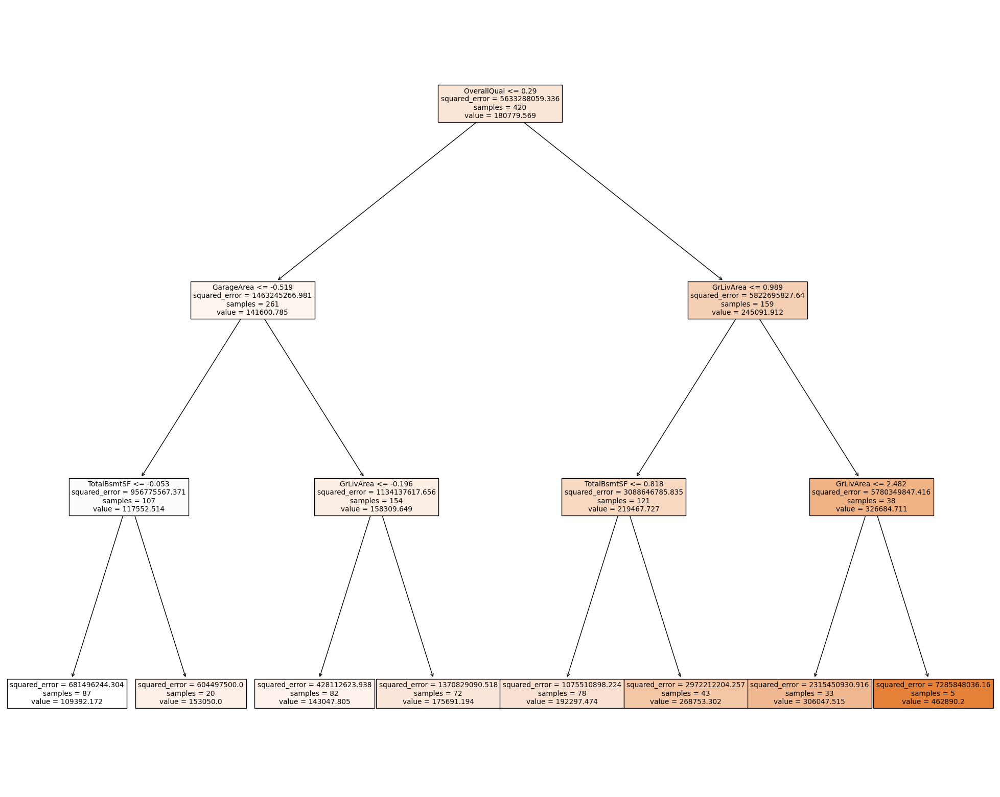

In [22]:
import math
from sklearn import tree

from sklearn.tree import DecisionTreeRegressor
coh = CategoricalOneHot(list_key_words=list(df_categorical2.columns))
df_categorical_ohe=(coh.fit_transform(df_categorical2))
# df2=df_numeric_scaler.apply(lambda x: x.fillna(x.mean()),axis=0)
# clf = LOF(n_neighbors=5,contamination=1/25)
# clf.fit(df2)
# df2['AnomalyLabel'] = clf.labels_
# df2=pd.concat([df2,df_categorical_ohe],axis=1)
# df2
# df_lof=df2[df2.AnomalyLabel==0]
# df_reg=df_lof
feat_list=[]
aic_dict=[]
r2_dict=[]
rmse_dict=[]
rmse_train_dict=[]
aic_last=1000000
r2_last=0
cols=['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
        'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold']+list(df_categorical_ohe.columns)
final_cols=[]
for var in list(cols):
    feat_list.append(var)
    X=df_reg[feat_list]
    y=df_reg['SalePrice']
    model = DecisionTreeRegressor(max_depth=3)
    X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=True, train_size=0.3)
    fitted=model.fit(X_train, y_train)
    from sklearn.metrics import mean_squared_error, r2_score
    predictions = model.predict(X_test)
    r2 = r2_score(y_test, predictions)
    n=len(X)
    p=len(feat_list)
    adjr2 = 1-(1-r2)*(n-1)/(n-p-1)
    rmse = math.sqrt(mean_squared_error(y_test, predictions))
    train_predictions = model.predict(X_train)
    rmse_train = math.sqrt(mean_squared_error(y_train, train_predictions))
#     X2 = sm.add_constant(X_train)
    r2_dict.append(adjr2)
    rmse_dict.append(rmse)
    final_cols.append(var)
    rmse_train_dict.append(rmse_train)
#Test vs Train

fig = plt.figure(figsize=(25,20))
_ = tree.plot_tree(model, feature_names=final_cols, filled=True)

importances = model.feature_importances_
indices = np.array([np.argsort(importances)][len(importances)-5:])

plt.show()

In [23]:
#df_reg.to_csv("training_df.csv")


<Figure size 2500x2000 with 0 Axes>

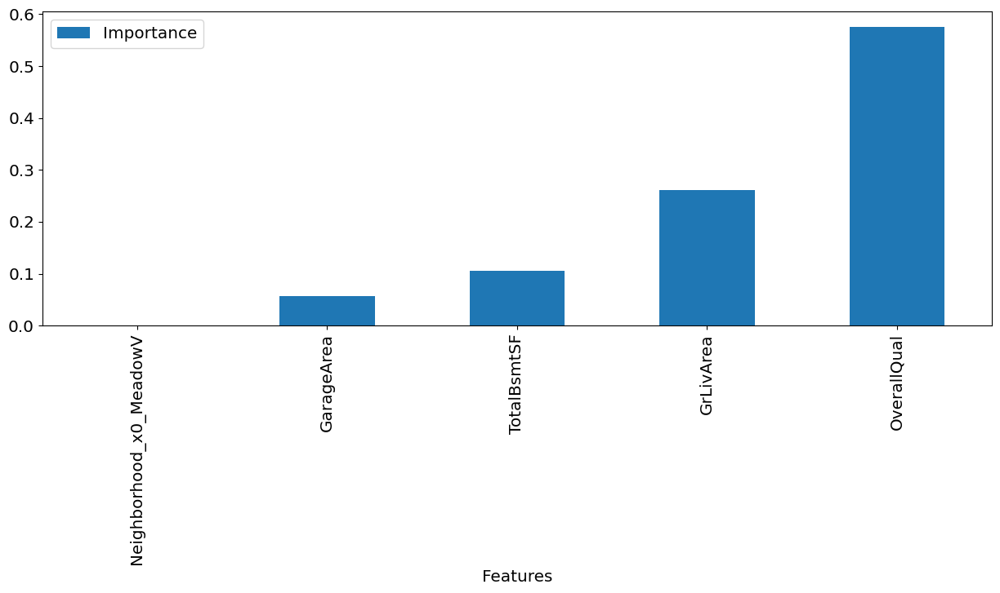

In [24]:
import matplotlib.pylab as pylab
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (15, 5),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
pylab.rcParams.update(params)
fig = plt.figure(figsize=(25,20))

top_indices=np.array(np.argsort(importances)[len(importances)-5:])
ft=pd.DataFrame({'Features': np.array(feat_list)[top_indices], 'Importance':(importances[top_indices])})
# sns.barplot(ft,x='Features',y='Importance')
ft.plot.bar(x='Features',y='Importance')
plt.show()

In [25]:
#R-square with DecisionTree
r2

0.6301994996243652

In [26]:
short_feat_list=ft.Features.values

X=df_reg[short_feat_list]
y=df_reg['SalePrice']
dtr_model = DecisionTreeRegressor(max_depth=3)
X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=True, train_size=0.3)
fitted=dtr_model.fit(X_train, y_train)
from sklearn.metrics import mean_squared_error, r2_score
predictions = dtr_model.predict(X_test)
r2 = r2_score(y_test, predictions)
r2

0.6279123573668803

In [27]:
#
from time import time
from sklearn.neural_network import MLPRegressor
from sklearn.pipeline import make_pipeline

from sklearn.ensemble import RandomForestRegressor

num_feat=['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
        'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold']
X=df_reg[short_feat_list]
y=df_reg['SalePrice']
X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=True, train_size=0.3)
print("Training RandomForestRegressor...")
tic = time()
mlp_model = make_pipeline(
     RandomForestRegressor(random_state=42))
mlp_model.fit(X_train, y_train)
print(f"done in {time() - tic:.3f}s")
print(f"Test R2 score: {mlp_model.score(X_test, y_test):.2f}")
fitted=mlp_model.fit(X_train, y_train)


Training RandomForestRegressor...
done in 0.236s
Test R2 score: 0.78


### Partial dependency plot

Computing partial dependence plots...


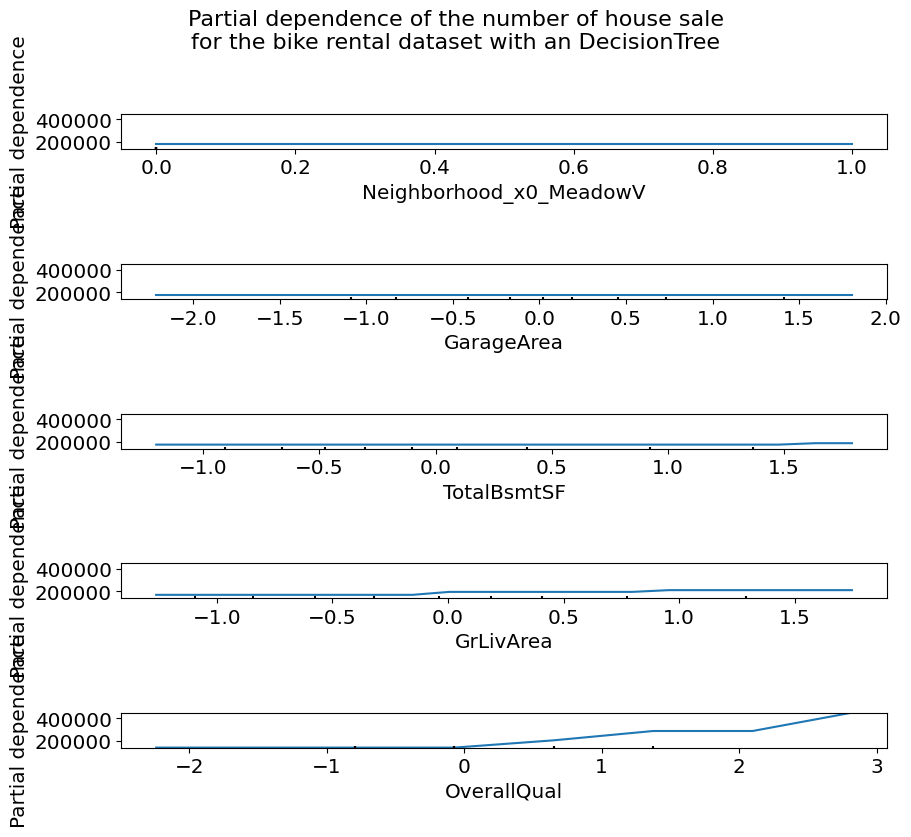

In [28]:
import time
from sklearn.inspection import partial_dependence
import matplotlib.pyplot as plt
from sklearn.inspection import PartialDependenceDisplay

common_params = {
    "subsample": 50,
    "n_jobs": 2,
    "grid_resolution": 20,
    "random_state": 0,
}

print("Computing partial dependence plots...")
features_info = {
    # features of interest
    "features": short_feat_list,
    # type of partial dependence plot
    "kind": "average",
    # information regarding categorical features
}
_, ax = plt.subplots(nrows=5, figsize=(9, 8), constrained_layout=True)
display = PartialDependenceDisplay.from_estimator(
    dtr_model,
    X_train[short_feat_list],
    **features_info,
    ax=ax,
    **common_params,
)
_ = display.figure_.suptitle(
    "Partial dependence of the number of house sale\n"
    "for the bike rental dataset with an DecisionTree",
    fontsize=16,
)
plt.show()

Computing partial dependence plots...


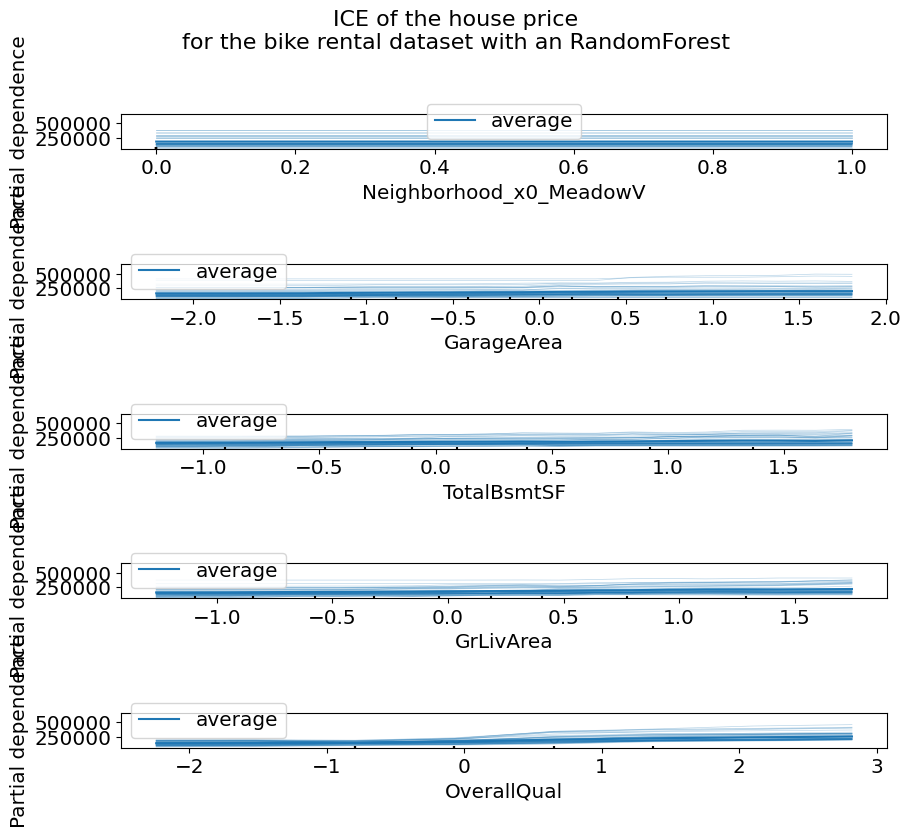

In [29]:
from sklearn.inspection import partial_dependence
import matplotlib.pyplot as plt
from sklearn.inspection import PartialDependenceDisplay

common_params = {
    "subsample": 50,
    "n_jobs": 2,
    "grid_resolution": 20,
    "random_state": 0,
}

print("Computing partial dependence plots...")
features_info = {
    # features of interest
    "features": short_feat_list,
    # type of partial dependence plot
    "kind": "both",
    # information regarding categorical features
}
_, ax = plt.subplots(nrows=5, figsize=(9, 8), constrained_layout=True)
display = PartialDependenceDisplay.from_estimator(
    mlp_model,
    X_train[short_feat_list],
    **features_info,
    ax=ax,
    **common_params,
)
_ = display.figure_.suptitle(
    "ICE of the house price\n"
    "for the bike rental dataset with an RandomForest",
    fontsize=16,
)
plt.show()

In [30]:
X_train[short_feat_list]

,Neighborhood_x0_MeadowV,GarageArea,TotalBsmtSF,GrLivArea,OverallQual
1109,0.0,0.313570,-0.356693,0.686343,-0.071836
1267,0.0,0.425861,-0.701005,0.775816,0.651479
735,0.0,0.482006,-0.454742,-1.251596,-0.795151
289,0.0,-0.458426,0.245284,-0.341640,-0.795151
1324,0.0,0.360358,0.336493,1.145128,-0.071836
...,...,...,...,...,...
429,0.0,0.491363,1.047920,0.709187,-0.071836
1310,1.0,-0.640898,-0.685044,-0.077030,-0.795151
862,0.0,-0.865479,-0.413698,-1.167834,-0.795151
156,0.0,-2.212963,-0.942708,-0.305470,-0.795151


### LIME

In [31]:
#
from time import time
from sklearn.neural_network import MLPRegressor
from sklearn.pipeline import make_pipeline

from sklearn.ensemble import RandomForestRegressor

num_feat=['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
        'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold']
X=df_reg[num_feat]
y=df_reg['SalePrice']
X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=True, train_size=0.3)
print("Training RandomForestRegressor...")
tic = time()
mlp_model = RandomForestRegressor(random_state=42)
mlp_model.fit(X_train, y_train)
print(f"done in {time() - tic:.3f}s")
print(f"Test R2 score: {mlp_model.score(X_test, y_test):.2f}")
fitted=mlp_model.fit(X_train, y_train)


Training RandomForestRegressor...
done in 0.521s
Test R2 score: 0.81


In [32]:
X_test.iloc[25]

MSSubClass      -0.872563
LotFrontage      0.904238
LotArea          0.141831
OverallQual      1.374795
OverallCond     -0.517200
MasVnrArea       0.454768
BsmtFinSF1      -0.973018
BsmtFinSF2      -0.288653
BsmtUnfSF        2.292787
TotalBsmtSF      1.191573
1stFlrSF         1.080004
2ndFlrSF        -0.795163
LowQualFinSF    -0.120242
GrLivArea        0.122856
BsmtFullBath    -0.819964
BsmtHalfBath    -0.241061
FullBath         0.789741
HalfBath        -0.761621
BedroomAbvGr     0.163779
KitchenAbvGr    -0.211454
TotRmsAbvGrd     0.296763
Fireplaces      -0.951226
GarageYrBlt      1.195013
GarageCars       1.650307
GarageArea       1.670412
WoodDeckSF      -0.752176
OpenPorchSF     -0.342128
EnclosedPorch   -0.359325
3SsnPorch       -0.116339
ScreenPorch     -0.270208
PoolArea        -0.068692
MiscVal         -0.087688
MoSold          -0.119110
Name: 1108, dtype: float64

In [33]:
import lime
import lime.lime_tabular
i = 25
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.to_numpy(), feature_names=num_feat, class_names=['SalePrice'], verbose=True, mode='regression')
exp = explainer.explain_instance(X_test.iloc[i], mlp_model.predict, num_features=32)

Intercept 156776.0739108335
Prediction_local [272993.81605699]
Right: 248461.61


X does not have valid feature names, but RandomForestRegressor was fitted with feature names


In [34]:
exp.show_in_notebook(show_table=True)

### Shap value

In [35]:
import shap
import time
# explain all the predictions in the test set
X_train_summary = shap.kmeans(X_train, 10)
# explainer = shap.KernelExplainer(mlp_model.predict,X_train_summary)

# shap_values = explainer.shap_values(X_test)
# shap.summary_plot(shap_values, X_test)

### Error Analysis
  

In [36]:
predictions=mlp_model.predict(X_test)
outcome=pd.DataFrame({'Actual':y_test,'Prediction':predictions})
outcome['difference']=abs(outcome['Actual']-outcome['Prediction'])
outcome2=pd.concat([X_test,outcome],axis=1)
outcome2

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,Actual,Prediction,difference
644,0.309859,-4.140106e-01,-0.091886,-1.518467,-3.214027,-0.572835,-0.973018,-0.288653,1.194795,0.085669,...,-0.704483,1.113713,-0.116339,-0.270208,-0.068692,-0.087688,-0.489110,87000,147032.25,60032.25
1295,0.782828,8.630423e-01,0.112867,-0.795151,-0.517200,1.460271,0.123613,-0.288653,0.409222,0.434542,...,-0.704483,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,0.620891,200000,176427.57,23572.43
318,-0.872563,-2.058048e-03,-0.234603,-0.795151,0.381743,-0.572835,0.882482,-0.288653,-0.808757,-0.003259,...,-0.704483,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,0.620891,139000,134375.75,4624.25
726,-0.636078,-4.140106e-01,-0.361383,-0.795151,-0.517200,-0.572835,-0.084747,-0.288653,0.391110,0.199680,...,-0.704483,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,1.360892,100000,142906.21,42906.21
235,-0.872563,4.098945e-01,-0.011709,0.651479,-0.517200,-0.009311,1.064522,-0.288653,0.789557,1.795831,...,-0.115656,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,-0.119110,241500,233167.34,8332.66
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
759,-0.872563,3.913721e-02,-0.232498,-0.071836,-0.517200,0.244828,-0.973018,-0.288653,0.209998,-0.906225,...,-0.704483,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,-0.859110,143500,141246.70,2253.30
1228,-0.872563,-8.259632e-01,-0.247331,0.651479,-0.517200,-0.274498,1.336487,-0.288653,-0.704617,0.573635,...,0.171209,-0.359325,-0.116339,1.344480,-0.068692,-0.087688,0.250891,180000,187804.08,7804.08
1119,0.073375,1.975314e+00,2.529922,2.821425,-0.517200,7.040263,2.069036,-0.288653,-0.054878,1.989649,...,0.442975,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,0.250891,625000,418322.38,206677.62
205,0.073375,-2.846969e-16,0.038402,-0.071836,1.280685,0.272451,-0.143965,-0.288653,-0.580103,-0.840099,...,-0.160950,-0.359325,-0.116339,-0.270208,-0.068692,0.819656,-1.229111,161750,142492.25,19257.75


In [37]:
outcome2.sort_values('difference',ascending=False)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,Actual,Prediction,difference
1132,0.073375,3.705515,0.511751,2.821425,-0.517200,-0.572835,3.624059,-0.288653,-0.605006,3.052229,...,0.473172,-0.359325,-0.116339,-0.270208,13.749810,-0.087688,0.250891,745000,349719.58,395280.42
659,0.073375,1.398581,1.104264,2.821425,0.381743,5.891116,2.218178,-0.288653,0.954822,3.161680,...,0.050424,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,-1.969111,755000,410683.24,344316.76
856,-0.872563,1.233800,0.240751,2.098110,-0.517200,3.625971,3.825839,-0.288653,-0.962702,2.901735,...,0.307092,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,-1.229111,611657,375212.05,236444.95
423,-0.872563,1.439776,0.492508,2.821425,-0.517200,0.532114,2.902476,3.053692,0.499778,4.643820,...,0.382583,-0.359325,-0.116339,2.779758,-0.068692,-0.087688,-0.859110,555000,339180.56,215819.44
1269,-0.872563,0.203918,-0.053201,1.374795,-0.517200,1.791756,-0.973018,-0.288653,2.779525,1.681820,...,0.035326,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,-1.599111,147000,355181.09,208181.09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255,-0.872563,0.327504,0.157666,-0.071836,0.381743,0.587362,0.316620,1.125178,0.087748,0.831299,...,-0.704483,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,-0.119110,175500,175467.50,32.50
80,0.073375,2.140095,0.139727,-0.071836,-0.517200,-0.572835,-0.973018,-0.288653,0.264332,-0.851500,...,-0.130754,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,-1.229111,174000,173969.40,30.60
94,0.073375,0.286309,-0.131374,-0.071836,-0.517200,1.283480,-0.973018,-0.288653,0.393374,-0.721527,...,-0.009969,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,-0.119110,178000,177988.30,11.70
408,0.073375,-0.414011,-0.715468,0.651479,2.179628,-0.572835,-0.973018,-0.288653,0.189623,-0.926747,...,-0.704483,1.702929,-0.116339,-0.270208,-0.068692,-0.087688,0.990891,135000,135009.20,9.20


In [38]:
# Imports for SHAP MimicExplainer with LightGBM surrogate model
from interpret.ext.blackbox import MimicExplainer
from interpret.ext.glassbox import LGBMExplainableModel
from raiwidgets import ErrorAnalysisDashboard

predictions = mlp_model.predict(X_test)

from interpret_community.common.constants import ModelTask
# Train the LightGBM surrogate model using MimicExplaner
model_task = ModelTask.Regression
explainer = MimicExplainer(mlp_model, X_train, LGBMExplainableModel,
                           augment_data=True, max_num_of_augmentations=10,
                           features=num_feat, model_task=model_task)
global_explanation = explainer.explain_global(X_test)
ErrorAnalysisDashboard(global_explanation, mlp_model, dataset=X_test, true_y=y_test, model_task='regression')

ErrorAnalysis started at http://localhost:5002


In [39]:
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


In [41]:
outcome2=outcome2.reset_index()[['index','Prediction','difference']]
df_reg2=df_reg.reset_index()
final_outcome=pd.merge(outcome2,df_reg2,on=['index','index'])
final_outcome['Id']=final_outcome['Unnamed: 0']
final_outcome2=pd.merge(final_outcome,df,on=['Id','Id'])
                    
final_outcome2[['OverallQual_y','GrLivArea_y','LotArea_y','SalePrice_y','Prediction','difference']]

,OverallQual_y,GrLivArea_y,LotArea_y,SalePrice_y,Prediction,difference
0,6,1441,2289,148500,147032.25,60032.25
1,8,2358,5250,122000,176427.57,23572.43
2,5,1728,10624,119000,134375.75,4624.25
3,6,864,9100,127500,142906.21,42906.21
4,7,2110,8880,205000,233167.34,8332.66
...,...,...,...,...,...,...
975,6,1564,8400,171000,141246.70,2253.30
976,7,1573,9808,227000,187804.08,7804.08
977,6,2108,13728,235000,418322.38,206677.62
978,5,990,13568,156000,142492.25,19257.75


In [42]:
import pkg_resources
import types
def get_imports():
    for name, val in globals().items():
        if isinstance(val, types.ModuleType):
            # Split ensures you get root package, 
            # not just imported function
            name = val.__name__.split(".")[0]

        elif isinstance(val, type):
            name = val.__module__.split(".")[0]
            
        # Some packages are weird and have different
        # imported names vs. system/pip names. Unfortunately,
        # there is no systematic way to get pip names from
        # a package's imported name. You'll have to add
        # exceptions to this list manually!
        poorly_named_packages = {
            "PIL": "Pillow",
            "sklearn": "scikit-learn"
        }
        if name in poorly_named_packages.keys():
            name = poorly_named_packages[name]
            
        yield name
imports = list(set(get_imports()))

# The only way I found to get the version of the root package
# from only the name of the package is to cross-check the names 
# of installed packages vs. imported packages
requirements = []
for m in pkg_resources.working_set:
    if m.project_name in imports and m.project_name!="pip":
        requirements.append((m.project_name, m.version))

for r in requirements:
    print("{}=={}".format(*r))

shap==0.41.0
seaborn==0.12.2
raiwidgets==0.26.0
matplotlib==3.5.3
lime==0.1.1.36
scikit-learn==1.0.2
pandas==1.3.0
numpy==1.21.6


seaborn==0.12.2
scikit-learn==0.24.0
numpy==1.20.0
matplotlib==3.5.3
lime==0.1.1.36
datasets==2.11.0
pandas==1.0.1